In [36]:
#Importing the Libraries and data
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from numpy import asarray
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import plotly.express as px # for graphing
import re
import plotly.graph_objects as go

In [37]:
# Save each CSV file path into a variable.
ElectricCarData_Clean_csv = '../16-Project-3-Data-Ethics/original_data/ElectricCarData_Clean.csv'
df = pd.read_csv ('../16-Project-3-Data-Ethics/original_data/Electric_Vehicle_Population_Data.csv')

In [38]:
CarData_data =  pd.read_csv(ElectricCarData_Clean_csv)

In [39]:
# Check data types.
CarData_data.dtypes


Brand               object
Model               object
AccelSec           float64
TopSpeed_KmH         int64
Range_Km             int64
Efficiency_WhKm      int64
FastCharge_KmH      object
RapidCharge         object
PowerTrain          object
PlugType            object
BodyStyle           object
Segment             object
Seats                int64
PriceEuro            int64
dtype: object

In [40]:
# Preview data.
CarData_data

,Brand,Model,AccelSec,TopSpeed_KmH,Range_Km,Efficiency_WhKm,FastCharge_KmH,RapidCharge,PowerTrain,PlugType,BodyStyle,Segment,Seats,PriceEuro
0,Tesla,Model 3 Long Range Dual Motor,4.6,233,450,161,940,Yes,AWD,Type 2 CCS,Sedan,D,5,55480
1,Volkswagen,ID.3 Pure,10.0,160,270,167,250,Yes,RWD,Type 2 CCS,Hatchback,C,5,30000
2,Polestar,2,4.7,210,400,181,620,Yes,AWD,Type 2 CCS,Liftback,D,5,56440
3,BMW,iX3,6.8,180,360,206,560,Yes,RWD,Type 2 CCS,SUV,D,5,68040
4,Honda,e,9.5,145,170,168,190,Yes,RWD,Type 2 CCS,Hatchback,B,4,32997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98,Nissan,Ariya 63kWh,7.5,160,330,191,440,Yes,FWD,Type 2 CCS,Hatchback,C,5,45000
99,Audi,e-tron S Sportback 55 quattro,4.5,210,335,258,540,Yes,AWD,Type 2 CCS,SUV,E,5,96050
100,Nissan,Ariya e-4ORCE 63kWh,5.9,200,325,194,440,Yes,AWD,Type 2 CCS,Hatchback,C,5,50000
101,Nissan,Ariya e-4ORCE 87kWh Performance,5.1,200,375,232,450,Yes,AWD,Type 2 CCS,Hatchback,C,5,65000


In [41]:
# Create dependencies and settings
import pandas as pd
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'svg')
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import numpy as np
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

C:\Users\lulum\AppData\Local\Temp\ipykernel_13992\1232982100.py:5: DeprecationWarning:

`set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`



In [42]:
# Read data
ElectricCarData_Clean_csv = '../16-Project-3-Data-Ethics/original_data/ElectricCarData_Clean.csv'
CarData_data =  pd.read_csv(ElectricCarData_Clean_csv)
CarData_data.head(5)

,Brand,Model,AccelSec,TopSpeed_KmH,Range_Km,Efficiency_WhKm,FastCharge_KmH,RapidCharge,PowerTrain,PlugType,BodyStyle,Segment,Seats,PriceEuro
0,Tesla,Model 3 Long Range Dual Motor,4.6,233,450,161,940,Yes,AWD,Type 2 CCS,Sedan,D,5,55480
1,Volkswagen,ID.3 Pure,10.0,160,270,167,250,Yes,RWD,Type 2 CCS,Hatchback,C,5,30000
2,Polestar,2,4.7,210,400,181,620,Yes,AWD,Type 2 CCS,Liftback,D,5,56440
3,BMW,iX3,6.8,180,360,206,560,Yes,RWD,Type 2 CCS,SUV,D,5,68040
4,Honda,e,9.5,145,170,168,190,Yes,RWD,Type 2 CCS,Hatchback,B,4,32997


# Explore Data (Exploratory Data Analysis)

In [43]:
#Check available features
CarData_data.columns

Index(['Brand', 'Model', 'AccelSec', 'TopSpeed_KmH', 'Range_Km',
       'Efficiency_WhKm', 'FastCharge_KmH', 'RapidCharge', 'PowerTrain',
       'PlugType', 'BodyStyle', 'Segment', 'Seats', 'PriceEuro'],
      dtype='object')

In [44]:
#Full summary of the dataset
CarData_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103 entries, 0 to 102
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Brand            103 non-null    object 
 1   Model            103 non-null    object 
 2   AccelSec         103 non-null    float64
 3   TopSpeed_KmH     103 non-null    int64  
 4   Range_Km         103 non-null    int64  
 5   Efficiency_WhKm  103 non-null    int64  
 6   FastCharge_KmH   103 non-null    object 
 7   RapidCharge      103 non-null    object 
 8   PowerTrain       103 non-null    object 
 9   PlugType         103 non-null    object 
 10  BodyStyle        103 non-null    object 
 11  Segment          103 non-null    object 
 12  Seats            103 non-null    int64  
 13  PriceEuro        103 non-null    int64  
dtypes: float64(1), int64(5), object(8)
memory usage: 11.4+ KB


In [45]:
#Check the number of rows and columns
CarData_data.shape

(103, 14)

In [46]:
#Check missing value
CarData_data.isnull().sum()

Brand              0
Model              0
AccelSec           0
TopSpeed_KmH       0
Range_Km           0
Efficiency_WhKm    0
FastCharge_KmH     0
RapidCharge        0
PowerTrain         0
PlugType           0
BodyStyle          0
Segment            0
Seats              0
PriceEuro          0
dtype: int64

In [47]:
#Check the unique values of the dataset
CarData_data.nunique()

Brand               33
Model              102
AccelSec            55
TopSpeed_KmH        25
Range_Km            50
Efficiency_WhKm     54
FastCharge_KmH      51
RapidCharge          2
PowerTrain           3
PlugType             4
BodyStyle            9
Segment              8
Seats                5
PriceEuro           87
dtype: int64

In [48]:
#Descriptive Statistics of the dataset
CarData_data.describe()

,AccelSec,TopSpeed_KmH,Range_Km,Efficiency_WhKm,Seats,PriceEuro
count,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000
mean,7.396117,179.194175,338.786408,189.165049,4.883495,55811.563107
std,3.017430,43.573030,126.014444,29.566839,0.795834,34134.665280
min,2.100000,123.000000,95.000000,104.000000,2.000000,20129.000000
25%,5.100000,150.000000,250.000000,168.000000,5.000000,34429.500000
50%,7.300000,160.000000,340.000000,180.000000,5.000000,45000.000000
75%,9.000000,200.000000,400.000000,203.000000,5.000000,65000.000000
max,22.400000,410.000000,970.000000,273.000000,7.000000,215000.000000


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]),
 [Text(0, 0, 'Tesla '),
  Text(1, 0, 'Volkswagen '),
  Text(2, 0, 'Polestar '),
  Text(3, 0, 'BMW '),
  Text(4, 0, 'Honda '),
  Text(5, 0, 'Lucid '),
  Text(6, 0, 'Peugeot '),
  Text(7, 0, 'Audi '),
  Text(8, 0, 'Mercedes '),
  Text(9, 0, 'Nissan '),
  Text(10, 0, 'Hyundai '),
  Text(11, 0, 'Porsche '),
  Text(12, 0, 'MG '),
  Text(13, 0, 'Mini '),
  Text(14, 0, 'Opel '),
  Text(15, 0, 'Skoda '),
  Text(16, 0, 'Volvo '),
  Text(17, 0, 'Kia '),
  Text(18, 0, 'Renault '),
  Text(19, 0, 'Mazda '),
  Text(20, 0, 'Lexus '),
  Text(21, 0, 'CUPRA '),
  Text(22, 0, 'SEAT '),
  Text(23, 0, 'Lightyear '),
  Text(24, 0, 'Aiways '),
  Text(25, 0, 'DS '),
  Text(26, 0, 'Citroen '),
  Text(27, 0, 'Jaguar '),
  Text(28, 0, 'Ford '),
  Text(29, 0, 'Byton '),
  Text(30, 0, 'Sono '),
  Text(31, 0, 'Smart '),
  Text(32, 0, 'Fiat ')])

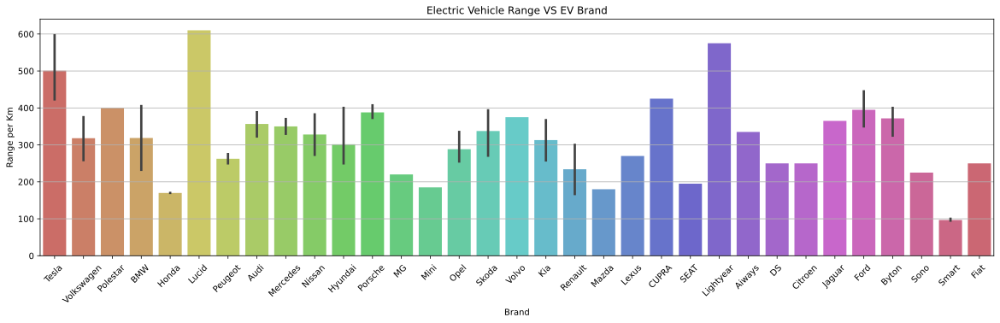

In [49]:
#Analysis range by EV Brand
ax= plt.figure(figsize=(20,5))
sns.barplot(x='Brand',y='Range_Km',data=CarData_data,palette='hls')
plt.grid(axis='y')
plt.title('Electric Vehicle Range VS EV Brand')
plt.xlabel('Brand')
plt.ylabel('Range per Km')
plt.xticks(rotation=45)


Lucid, Lightyear and Tesla have the highest Range and Smart the lowest

# Model with highest Range

In [50]:
range_df = CarData_data.sort_values(by=['Range_Km'], ascending=False)
range_df[['Brand','Model','Range_Km']].head(n=1)

,Brand,Model,Range_Km
51,Tesla,Roadster,970


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]),
 [Text(0, 0, 'Tesla '),
  Text(1, 0, 'Volkswagen '),
  Text(2, 0, 'Polestar '),
  Text(3, 0, 'BMW '),
  Text(4, 0, 'Honda '),
  Text(5, 0, 'Lucid '),
  Text(6, 0, 'Peugeot '),
  Text(7, 0, 'Audi '),
  Text(8, 0, 'Mercedes '),
  Text(9, 0, 'Nissan '),
  Text(10, 0, 'Hyundai '),
  Text(11, 0, 'Porsche '),
  Text(12, 0, 'MG '),
  Text(13, 0, 'Mini '),
  Text(14, 0, 'Opel '),
  Text(15, 0, 'Skoda '),
  Text(16, 0, 'Volvo '),
  Text(17, 0, 'Kia '),
  Text(18, 0, 'Renault '),
  Text(19, 0, 'Mazda '),
  Text(20, 0, 'Lexus '),
  Text(21, 0, 'CUPRA '),
  Text(22, 0, 'SEAT '),
  Text(23, 0, 'Lightyear '),
  Text(24, 0, 'Aiways '),
  Text(25, 0, 'DS '),
  Text(26, 0, 'Citroen '),
  Text(27, 0, 'Jaguar '),
  Text(28, 0, 'Ford '),
  Text(29, 0, 'Byton '),
  Text(30, 0, 'Sono '),
  Text(31, 0, 'Smart '),
  Text(32, 0, 'Fiat ')])

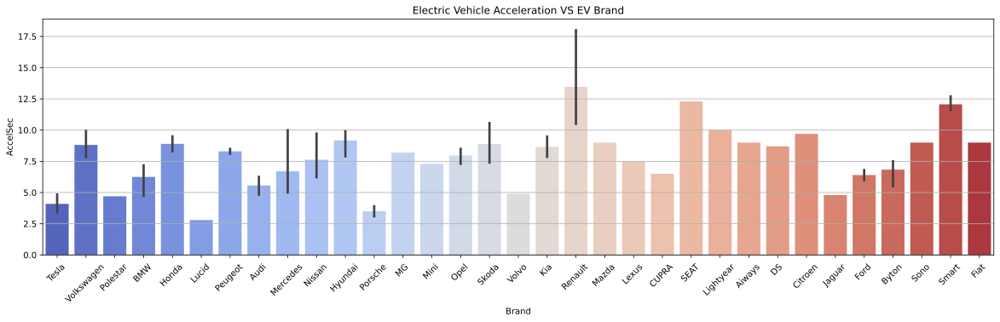

In [51]:
#Analysis acceleration by EV Brand
ax= plt.figure(figsize=(20,5))
sns.barplot(x='Brand',y='AccelSec',data=CarData_data,palette='coolwarm')
plt.grid(axis='y')
plt.title('Electric Vehicle Acceleration VS EV Brand')
plt.xlabel('Brand')
plt.ylabel('AccelSec')
plt.xticks(rotation=45)

Lucid,Porsche and Tesla are ranking in Top 3, they can accelerate to 60 mph (97 km/h) at very short time and Renault needs the longest time

In [52]:
fig = px.box(CarData_data,x='PriceEuro',y ='Brand' , color='Brand', points='all', hover_data=['Model'] ,
           height=1000, width= 900, orientation='h', title='Price and Brand' , template='ggplot2' ,
            labels=dict(PriceEuro='Price (€)'))
fig.show()

We can see from this graph that Porsche have the most expensive cars in the market with the average price of 148.301k Euro, but the Tesla Roadster is the most expensive with the price 215k Euro and the SEAT Mii Electric is the most affordable with the price 20.129k Euro

# Acceleration and Top Speed

In [53]:
fig = px.scatter(CarData_data,x = 'TopSpeed_KmH',y = 'AccelSec', color = 'Brand', hover_data=['Model'] ,
           opacity=0.8 , title='Acceleration and Top Speed' , height=650 , width=900 , template='ggplot2' ,
                labels=dict(AccelSec='Acceleration (Sec)', TopSpeed_KmH='Top Speed (Km/H)'))

fig.update_traces(marker={'size': 8}) # adjusting the markers size
fig.show()

We can see from here that the Tesla Roadster can go from 0 to 100 Km/H in 2.1 Seconds and its top speed is 410 Km/H, which make it the best car in terms of top speed and acceleration, with most of the cars lying between 140-260 Km/H top speed and 2-10 Seconds acceleration.

# Range and Fast Charging

In [54]:
fig = px.scatter(CarData_data, x = 'FastCharge_KmH', y = 'Range_Km', color = 'Brand', hover_data=['Model'] ,
           opacity=0.8 , title='Range and Fast Charging' , height=650 , width=900 , template='ggplot2' ,
                labels=dict(Range_Km='Range (Km)', FastCharge_KmH='Fast Charging (Km/H)'))

fig.update_traces(marker={'size': 8}) # adjusting the markers size
fig.show()

We can see here that in general, Tesla and Porscha cars have the best charging rates ranging between 700-970 Km/H, with Tesla topping in the range with some of their cars that can go over 500 Km with a full battery.

# Average Price and Range

In [55]:
fig = px.histogram(CarData_data, x='Range_Km', y='PriceEuro', color='Brand', barmode='group', histfunc='avg', 
                   height=400 , width=1100 , nbins=10 , template='ggplot2' , title='Average Price and Range' ,
                    labels=dict(PriceEuro='Price (€)', Range_Km='Range (Km)'))

fig.show()

This histogram shows the average price of each brand's cars in a certain range. We can see on here that most of the cars ranging 200-500 Km with their price going between 25-150k Euro depending on the brand. Some cars can go between 100-200 Km with a single charge and priced between 20k-35k Euro which make them slightly cheeper than the others.

In [56]:
px.pie(CarData_data,names = 'Brand',values = 'PriceEuro')

In [57]:
px.scatter_3d(CarData_data,x = 'Brand',y = 'Seats',z = 'Segment',color='Brand')

In [58]:
def range(dataframe, price):
  plt.figure(figsize=(20,5))
  sns.set_theme(style="whitegrid")
  sns.barplot('FullName', 'Range_Km' , data = dataframe, hue = dataframe['PowerTrain'])
  plt.title('''Range(Km) of EV's costing {} '''.format(price), fontsize = 20)
  plt.ylabel('Range (Km)', fontsize= 15)
  plt.xlabel('Model', fontsize= 15)
  plt.xticks(rotation = 90)
  plt.show()

# Dataset comes from Washington State department of motor vehicles. It describes a subset of the electric vehicle population in the united states

In [59]:
def createDict(x_val,y_val,text_val,showarrow_val=True):
    
    """
    Helper function for creating annotations
    """
    
    return dict(
    
        x = x_val,
        y = y_val,
        text = text_val,
        bgcolor = None,
        showarrow = showarrow_val

    )

def extract_lat_lon(df, column_name):
    # Create new columns for latitude and longitude
    df['latitude'] = None
    df['longitude'] = None
    
    # Define the regular expression pattern to match the longitude and latitude values
    pattern = r'^POINT \((?P<longitude>-?\d+\.\d+) (?P<latitude>-?\d+\.\d+)\)$'
    
    # Loop through each row in the DataFrame
    for i, row in df.iterrows():
        # Extract the longitude and latitude values using the regular expression pattern
        if pd.isna(row[column_name]):
            continue

        match = re.match(pattern, row[column_name])
        if match:
            longitude = float(match.group('longitude'))
            latitude = float(match.group('latitude'))
            
            # Assign the latitude and longitude values to the new columns
            df.at[i, 'latitude'] = latitude
            df.at[i, 'longitude'] = longitude
        
    

extract_lat_lon(df,'Vehicle Location')


In [60]:
fig = go.Figure(go.Scattermapbox(
    lat = df['latitude'],
    lon = df['longitude'],
    mode = 'markers',
    marker = go.scattermapbox.Marker(size=14)
))

fig.update_layout(
    mapbox_style='open-street-map',
    mapbox=dict(
        center=dict(
            lat=37.0902,
            lon=-95.7129
        ),

        zoom=3
    ),
    title='Map of Vehicle Locations',
    plot_bgcolor='#1E1E24',
    paper_bgcolor='#1E1E24',
    title_font_color='white'
)

fig.update_layout(title_x=0.5)

fig.show()

A graph of locations of all cars in this dataset.

Majority, but not all, are located within the state of Washington

In [61]:
top_20_values = df['Make'].value_counts().nlargest(20).index.tolist()
df_filtered = df[df['Make'].isin(top_20_values)]

fig = px.histogram(df_filtered, x='Make')

fig.update_xaxes(categoryorder='total descending')
fig.update_layout(title=dict(
                        text='Top 20 count of Vehicles by Make',
                        font=dict(
                            size=24,
                            family='Arial',
                            color='white')
                  ),
                  xaxis=dict(
                        titlefont=dict(
                            size=18,
                            family='Arial',
                            color='white'
                    )
                  ),
                  yaxis=dict(
                        title='Count',
                        titlefont=dict(
                            size=18,
                            family='Arial',
                            color='white'
                    )
                  ),
                  plot_bgcolor='#1E1E24',
                  paper_bgcolor='#1E1E24',
                  
                  title_x=0.5,
                  template='plotly_dark')
fig.update_traces(marker=dict(color='#F374AE'))
fig.show()

An overwhelming majority of electric cars are Tesla's.